# Advanced lane finding

The aim of the present project is to determine the position of lane lines around the vehicle. For this purpose, a front-facing camera is used to capture a video of the road on which the car drives. Those images are then processed in order to extract the information related to the lane lines. This is done by combining thresholds applied in different colorspaces and on the gradients in the image. This binary image is then transformed to remove the camera distortion and to obtain a bird's eye view on the road. Histogram methods are used to extract the pixels associated to a given lane line. Finally, the fitting of polynomials to those pixels can be used to extract the curvature of the road and the distance of the vehicle with respect to the lines.

In [2]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Camera distortion

The usage of lenses on a camera allows to focus more light on the image plane, but comes at the cost of a distortion of this image. This distorition is usually divided in its radial and its tangential component. 

In order to obtain correct geometrical information on the lane lines, this distortion should be corrected. This can be done by taking images of known geometry, such as a chessboard. By comparing the position of the corners in the image of a chessboard and their known real position, the parameters of the distortion models can be estimated. The latter are then used to undistort images of the real road.

### Camera calibration

The first step in this process consists in the determination of the camera parameters based on reference images.

In [3]:
def camera_calibration(path, nx = 9, ny = 6):
    """ Returns the camera matrix and the distortion coefficients based on the images stored 
    at the location provided in path.
    """
    # Initialisation of real and measured corner position
    obj_points = []
    img_points = []
    
    # Known real corner position
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    # Image list
    im_list = os.listdir(path)
    print(len(im_list), " images detected in folder")
    
    # Extract corners for each image
    for image in im_list:
        im_path = os.path.join(path, image)
        im = cv2.imread(im_path)
        gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret == False:
            print("Corner detection failed for : ", image)
        else:
            obj_points.append(objp)
            img_points.append(corners)

    # Compute camera properties
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, 
                                                       gray.shape[::-1],None,None)
    return mtx, dist

In [4]:
path = 'C:\\Users\\ngnem2\\CarND-Advanced-Lane-Lines\\camera_cal'
print("Calibration folder : ", path)
mtx, dist = camera_calibration(path)
print("Camera matrix :")
print(mtx)
print("Distortion coefficients :")
print(dist)

Calibration folder :  C:\Users\ngnem2\CarND-Advanced-Lane-Lines\camera_cal
20  images detected in folder
Corner detection failed for :  calibration1.jpg
Corner detection failed for :  calibration4.jpg
Corner detection failed for :  calibration5.jpg
Camera matrix :
[[  1.15396093e+03   0.00000000e+00   6.69705359e+02]
 [  0.00000000e+00   1.14802495e+03   3.85656232e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
Distortion coefficients :
[[ -2.41017968e-01  -5.30720497e-02  -1.15810318e-03  -1.28318543e-04
    2.67124302e-02]]


### Image undistortion 

The second step uses the previously computed camera parameters to correct its output images.

In [5]:
def compare_plot(images, titles = ['Original image','Transformed image'], cmap = None):
    """ Plots the pair of images provided in the images parameter and uses the pair of titles provided
    in the titles parameter.
    """
    f, axarr = plt.subplots(1,2, figsize = (10,6))
    for i, ax in enumerate(axarr):
        ax.imshow(images[i], cmap)
        ax.set_title(titles[i])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()

In [6]:
def undistort(img, mtx, dist):
    """ Wrapper for the open cv undistort function that makes it easier to use.
    """
    return cv2.undistort(img, mtx, dist, None, mtx)

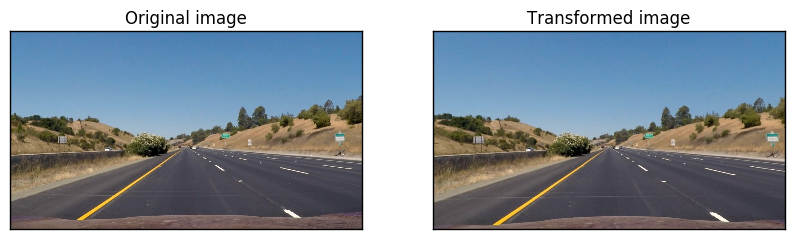

In [7]:
path = 'C:\\Users\\ngnem2\\CarND-Advanced-Lane-Lines\\test_images\\straight_lines1.jpg'
img = cv2.imread(path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
undist = undistort(img, mtx, dist)
compare_plot((img, undist))

## Perspective transformation

A perspective transformation is a transformation that changes the point-of-view from which an image is taken. In the present project, such a transformation is used to visualize the images taken by the front facing camera from a bird's eye viewpoint.

As a first example, this method is applied to a reference cherkerboard. The transformation changes the angle from which the image was taken to a front facing point-of-view.

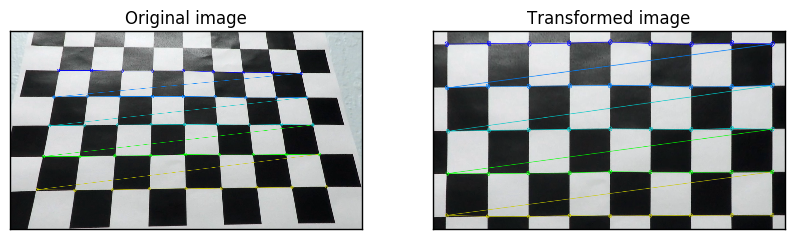

In [8]:
# Load checkerboard
path = 'C:\\Users\\ngnem2\\CarND-Advanced-Lane-Lines\\camera_cal\\calibration3.jpg'
img = cv2.imread(path)

# Camera distortion
undist = undistort(img, mtx, dist)

# Extract position of corners
gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
ret, corners = cv2.findChessboardCorners(gray, (9, 5), None)
cv2.drawChessboardCorners(undist, (9, 5), corners, ret)

# The outer points of the board are extracted
src = np.vstack((corners[0,:],corners[8,:],corners[36,:],corners[44,:]))

# Their position is mapped to a rectangle
l   = gray.shape[1]
h   = gray.shape[0]
offset = 50
dst = np.array([[offset,offset],[l-offset,0+offset],[0+offset,h-offset],[l-offset,h-offset]], dtype = np.float32)

# Transformation
M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(undist, M, (l,h), flags=cv2.INTER_LINEAR)
compare_plot((undist, warped))

The same method is the applied on images taken from the road. For this purpose, a reference image is taken considering a straight road. This is used to define a trapezium that fits the lane. This shape is then projected to a rectangle, which represents a bird's eye view of the same lane.

Image height = 720
Image width = 1280


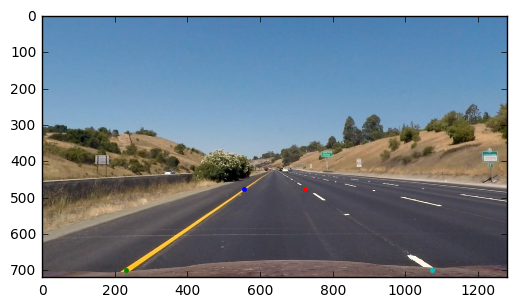

In [9]:
# Load image
path = 'C:\\Users\\ngnem2\\CarND-Advanced-Lane-Lines\\test_images\\straight_lines1.jpg'
img = cv2.imread(path)
img = undistort(img, mtx, dist)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Image parameters
height = img.shape[0]
print('Image height =' ,height)
width = img.shape[1]
print('Image width =' ,width)

# Trapezium
upper_y_offset = 115
upper_x_offset = 555
lower_x_offset = 227
lower_y_offset = 20
p_UL = (upper_x_offset, height/2 + upper_y_offset)
p_LL = (lower_x_offset + 5, height - lower_y_offset)
p_UR = (width - upper_x_offset, height/2 + upper_y_offset)
p_LR = (width - lower_x_offset + 20, height - lower_y_offset)

# Plot shape
plt.plot(p_UL[0], p_UL[1],'.')
plt.plot(p_LL[0], p_LL[1],'.')
plt.plot(p_UR[0], p_UR[1],'.')
plt.plot(p_LR[0], p_LR[1],'.')
plt.imshow(img)
plt.show()

In [10]:
def bird_matrix(direction = 'normal'):
    # Parameters
    upper_y_offset = 115
    upper_x_offset = 555
    lower_x_offset = 250
    lower_y_offset = 20
    height = 720
    p_UL = (upper_x_offset, height/2 + upper_y_offset)
    p_LL = (lower_x_offset + 5, height - lower_y_offset)
    p_UR = (width - upper_x_offset, height/2 + upper_y_offset)
    p_LR = (width - lower_x_offset + 20, height - lower_y_offset)

    # Source shape
    src = np.array([p_UL,p_LL,p_UR,p_LR], dtype = np.float32)

    # Target shape
    offset_x = 300
    offset_y = 0
    height = 2000
    dst = np.array([[offset_x, offset_y],[offset_x, height-offset_y],[width - offset_x, offset_y],[width - offset_x, height-offset_y]], dtype = np.float32)

    # Apply transform
    if direction == 'normal':
        M = cv2.getPerspectiveTransform(src, dst)
    else:
        M = cv2.getPerspectiveTransform(dst, src)
    return M

In [11]:
def bird_transform(img):
    M = bird_matrix()
    width = 1280
    height = 2000
    return cv2.warpPerspective(img, M, (width, height), flags=cv2.INTER_LINEAR)

In [12]:
def bird_inverse(img):
    M = bird_matrix(direction = "inverse")
    return cv2.warpPerspective(img, M, (width, height), flags=cv2.INTER_LINEAR)

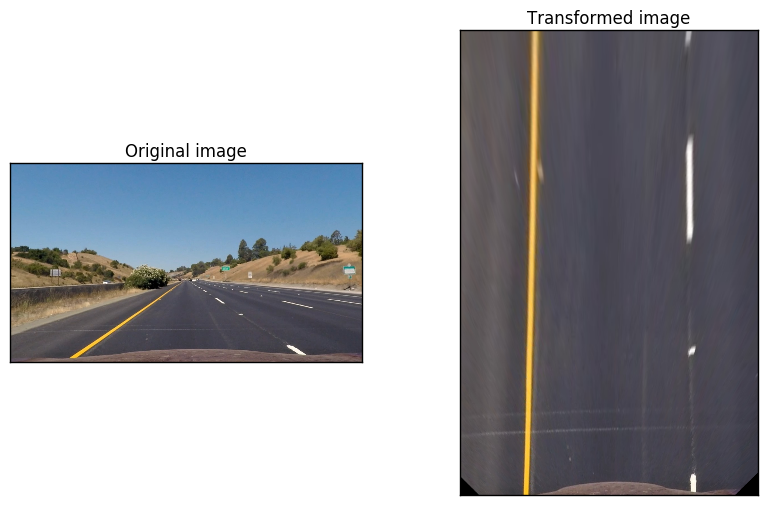

In [13]:
compare_plot((img, bird_transform(img)))

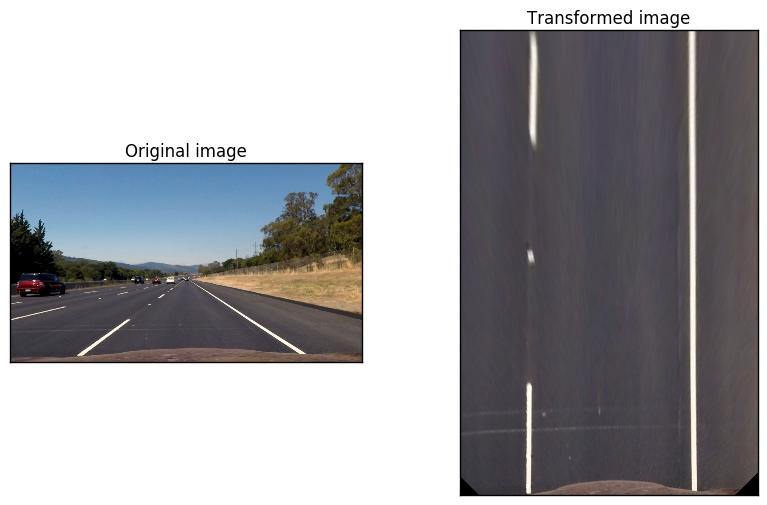

In [14]:
# Load image
path = 'C:\\Users\\ngnem2\\CarND-Advanced-Lane-Lines\\test_images\\straight_lines2.jpg'
img = cv2.imread(path)
img = cv2.undistort(img, mtx, dist, None, mtx)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
compare_plot((img, bird_transform(img)))

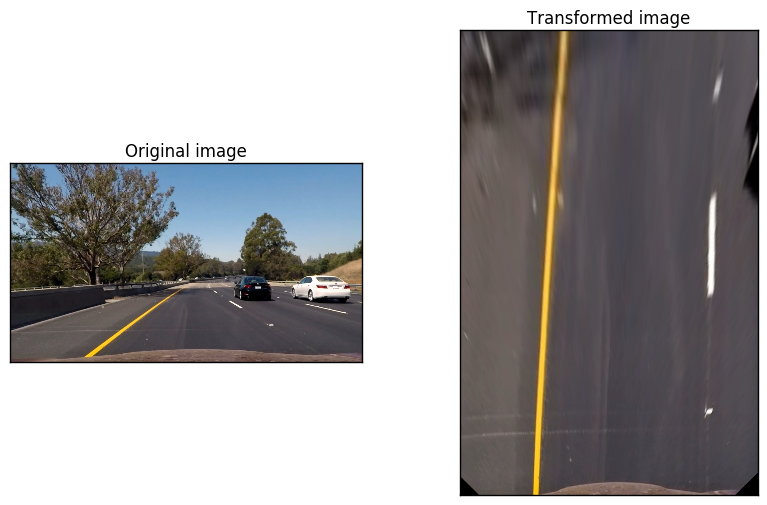

In [15]:
path = 'C:\\Users\\ngnem2\\CarND-Advanced-Lane-Lines\\test_images\\test6.jpg'
img = cv2.imread(path)
img = cv2.undistort(img, mtx, dist, None, mtx)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
compare_plot((img, bird_transform(img)))

## Image thresholding

The aim of this section is to transform the color images provided by the camera into binary images, in which the lane lines are emphasized. This is achived by thresholding several values in the images. Possible values are the color intensities, the gradient amplitude, the gradient direction, etc. Several of those indicators should be combined in order to obtain a robust detection method. This includes the dectection of lane lines in varying light conditions, varying colors for the lines, varying colors for the road, etc.

### Helper functions

Those functions are used to evaluate the image thresholding on a list of test images.

In [16]:
def plot_image_arr(image_arr, cmap = None):
    nx = 2
    ny = 7
    f, axarr = plt.subplots(ny, nx, figsize = (nx*6,ny*3))
    im_shape = len(image_arr.shape)
    i = 0
    for ax_y in axarr:
        for ax in ax_y:
            if im_shape == 4:
                im = image_arr[i,:,:,:]
            else:
                im = image_arr[i,:,:]
            ax.imshow(im.astype(np.uint8), cmap)
            ax.set_xticks([])
            ax.set_yticks([])
            i += 1
    plt.show()

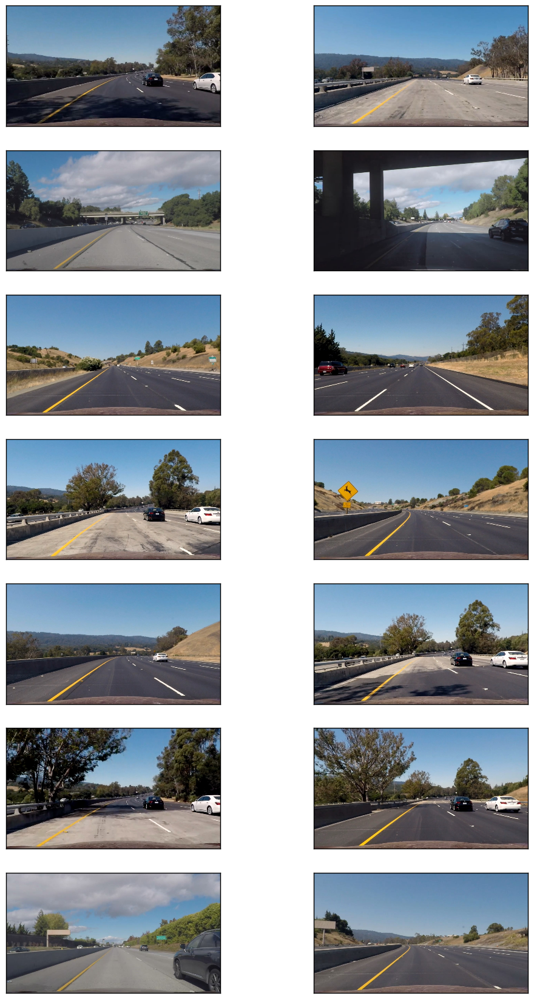

In [17]:
# Scan for test images
path = 'C:\\Users\\ngnem2\\CarND-Advanced-Lane-Lines\\test_images'
images = os.listdir(path)

# Array to store test images
n_images = len(images)
image_arr = np.zeros((n_images, 720, 1280, 3))

# Load images
for i, image in enumerate(images):
    im_path = os.path.join(path, image)
    im = cv2.imread(im_path)
    im = undistort(im, mtx, dist)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    image_arr[i,:,:,:] = im

plot_image_arr(image_arr)

In [18]:
def apply_image_arr(image_arr, func, out = 'c', out_shape = (720, 1280)):
    n_images = image_arr.shape[0]
    if out == 'c':
        out_arr = np.zeros((n_images, out_shape[0], out_shape[1], 3))
    else:
        out_arr = np.zeros((n_images, out_shape[0], out_shape[1]))
    for i in range(n_images):
        if len(image_arr.shape) == 4:
            im = image_arr[i,:,:,:]
        else:
            im = image_arr[i,:,:]
        if out == 'c':
            out_arr[i,:,:,:] = func(im)
        else:
            out_arr[i,:,:] = func(im)
    return out_arr

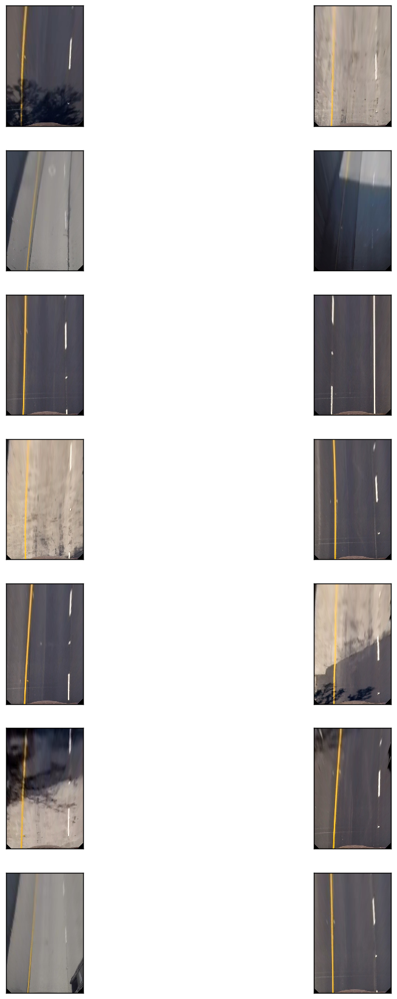

In [19]:
perspective = apply_image_arr(image_arr, bird_transform, out_shape=(2000, 1280))
plot_image_arr(perspective)

### Gradient operations

#### Sobel operator

The sobel operator allows to compute the gradient of a single channel image along a given direction. 

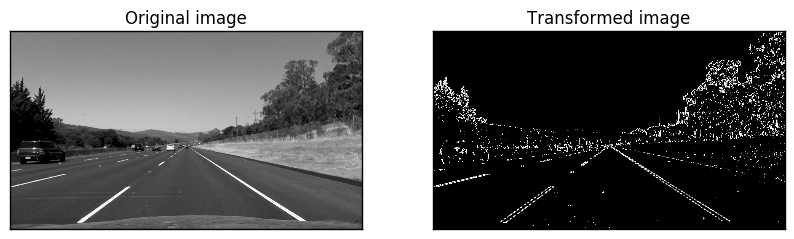

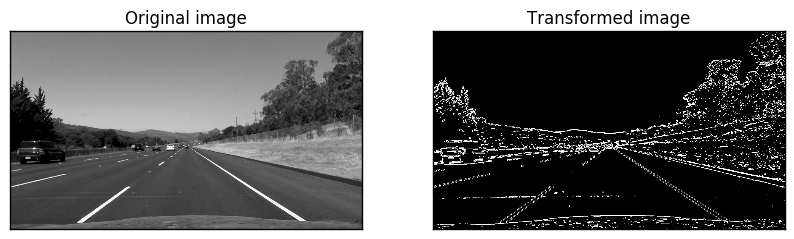

In [20]:
# Image loading
path = 'C:\\Users\\ngnem2\\CarND-Advanced-Lane-Lines\\test_images\\straight_lines2.jpg'
img = cv2.imread(path)
img = cv2.undistort(img, mtx, dist, None, mtx)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Gradient along the X and Y direction
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)

# Absolute value of the gradient
abs_sobelx = np.absolute(sobelx)
abs_sobely = np.absolute(sobely)

# Scale the gradient to occupy the entire 255 range
scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))

# Thresholding
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobelx)
sybinary = np.zeros_like(scaled_sobely)
sxbinary[(scaled_sobelx >= thresh_min) & (scaled_sobelx <= thresh_max)] = 1
sybinary[(scaled_sobely >= thresh_min) & (scaled_sobely <= thresh_max)] = 1

# Pltting
compare_plot((gray, sxbinary), cmap = 'gray')
compare_plot((gray, sybinary), cmap = 'gray')

#### Thresholding on the absolute value of the sobel operator

In [21]:
def abs_sobel_thresh(img, orient='y', thresh_min=25, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2HLS)
    gray = hls[:,:,2]
    #gray = cv2.equalizeHist(gray)
    # Take sobel operation along good axis
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        
    # Absolute value
    abs_sobel = np.absolute(sobel)
    
    # Thresholding
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sbinary


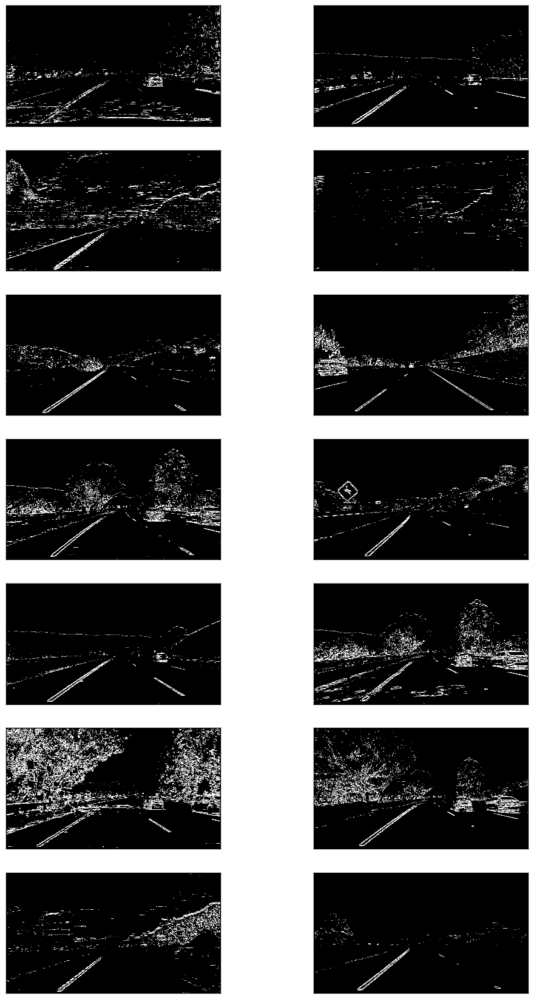

In [22]:
abs_sobel = apply_image_arr(image_arr, abs_sobel_thresh, out = 'g')
plot_image_arr(abs_sobel.reshape((n_images, 720, 1280)), cmap = 'gray')

#### Sobel magnitude

Computation of the magnitude of the gradient of the image by taking the sobel operation along the X and Y axis. The 2-norm of the resulting vector is taken and a threshold is applied on it. This results in a detector that is very close to a regular canny edge detector.

In [23]:
def mag_sobel_thresh(img, sobel_kernel=3, thresh_min = 50,thresh_max = 255):
    # Gray scale
    gray = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    
    # X and Y sobel
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # Magnitude
    sobel_mag = np.sqrt(sobel_x**2 + sobel_y**2)
    
    # Scaling
    scale_factor = np.max(sobel_mag)/255
    scaled_sobel = (sobel_mag/scale_factor).astype(np.uint8)
    
    # Thresholding
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sbinary

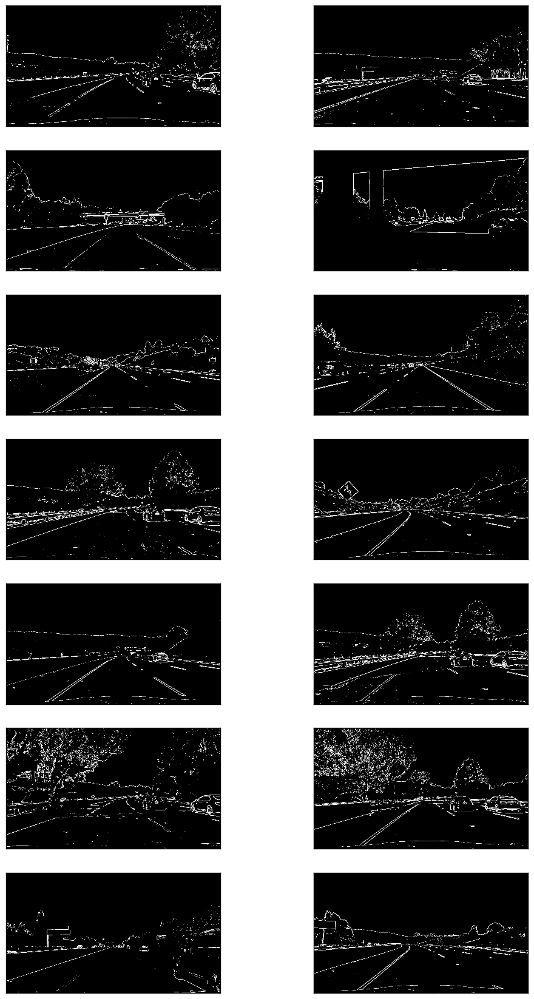

In [24]:
mag_sobel = apply_image_arr(image_arr, mag_sobel_thresh, out = 'g')
plot_image_arr(mag_sobel.reshape((n_images, 720, 1280)), cmap = 'gray')

#### Sobel direction

The sobel operator is applied along the X and Y axis and the angle of the resulting vector is computed. This value is thresholded.

In [25]:
def dir_sobel_thresh(img, sobel_kernel=3, thresh_min=0.4, thresh_max = 1.3):
    # Grayscale
    gray = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    
    # X and Y sobel
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # Sobel direction
    sobel_abs_x = np.absolute(sobel_x)
    sobel_abs_y = np.absolute(sobel_y)
    sobel_angle = np.arctan2(sobel_abs_y, sobel_abs_x)
    
    # Thresholding
    sbinary = np.zeros_like(sobel_angle)
    sbinary[(sobel_angle >= thresh_min) & (sobel_angle <= thresh_max)] = 1
    return sbinary

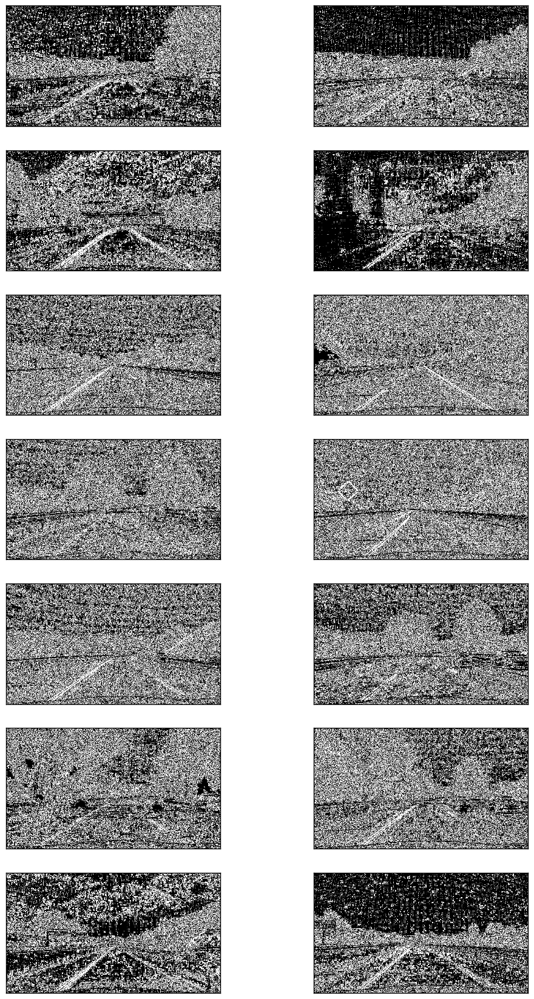

In [26]:
dir_sobel = apply_image_arr(image_arr, dir_sobel_thresh, out = 'g')
plot_image_arr(dir_sobel.reshape((n_images, 720, 1280)), cmap = 'gray')

### Color thresholding

#### HLS colorspace

Transforms the image from the RGB to the HLS color space and applies a thresholding to the S component. This is a very robust way to extract lane lines, as it is less sensitive to the variations of light and the presence of shadows in the scene.

In [27]:
def hls_thresh(img, component = 's', thresh_min = 180, thresh_max=255):
    hls = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2HLS)
    if component == 's':
        s = hls[:,:,2]
    elif component == 'h':
        s = hls[:,:,0]
    binary = np.zeros_like(s)
    binary[(s > thresh_min) & (s <= thresh_max)] = 1
    return binary

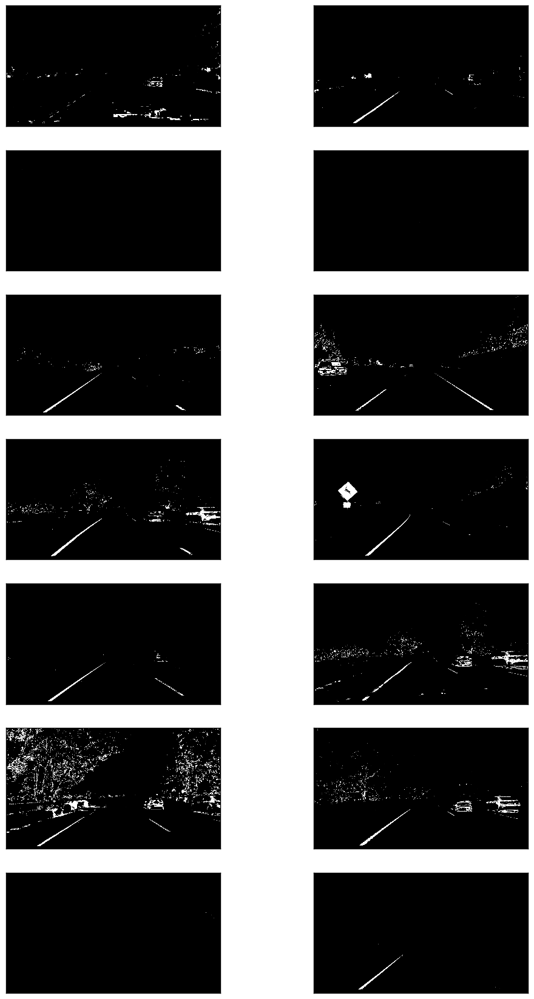

In [28]:
s_component = apply_image_arr(image_arr, hls_thresh, out = 'g')
plot_image_arr(s_component.reshape((n_images, 720, 1280)), cmap = 'gray')

In [29]:
def rgb_thresh(img, component = 'r', thresh_min = 210, thresh_max=255):
    if component == 'r':
        s = img[:,:,0]
    elif component == 'b':
        s = img[:,:,1]
    else:
        s = img[:,:,2]
        
    binary = np.zeros_like(s)
    binary[(s > thresh_min) & (s <= thresh_max)] = 1
    return binary

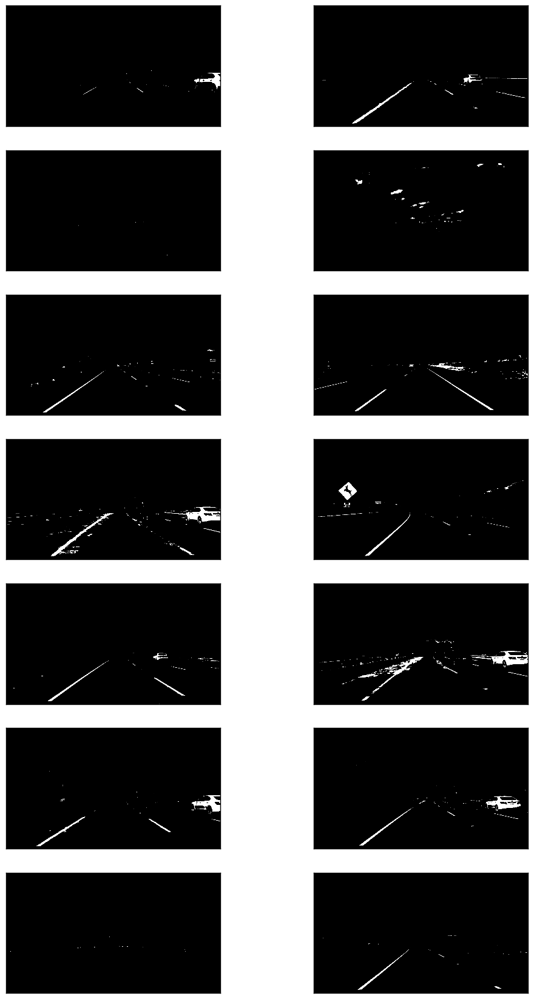

In [30]:
r_component = apply_image_arr(image_arr, rgb_thresh, out = 'g')
plot_image_arr(r_component.reshape((n_images, 720, 1280)), cmap = 'gray')

In [31]:
def rgb_thresh2(img, thresh_min = 15, thresh_max=255):
    cr = 2
    cg = 1
    cb = 0.1
    s = (cr*img[:,:,0] + cg*img[:,:,1] + cb*img[:,:,2])/(cr+cg+cb)
    s = cv2.blur(s, (7,7))
    tau = 15
    width = s.shape[1]
    out = np.zeros_like(s)
    for i in range(tau, width-tau):
        out[:,i] = s[:,i] - (s[:,i-tau] + s[:, i+tau])/2 - np.abs(s[:,i-tau] - s[:, i+tau])/2 #
    out = out/np.max(out) * 255
    out[out < 0] = 0
    out[out > 255] = 255
    binary = np.zeros_like(out)
    binary[(out>thresh_min) & (out<thresh_max)] = 1
    return binary

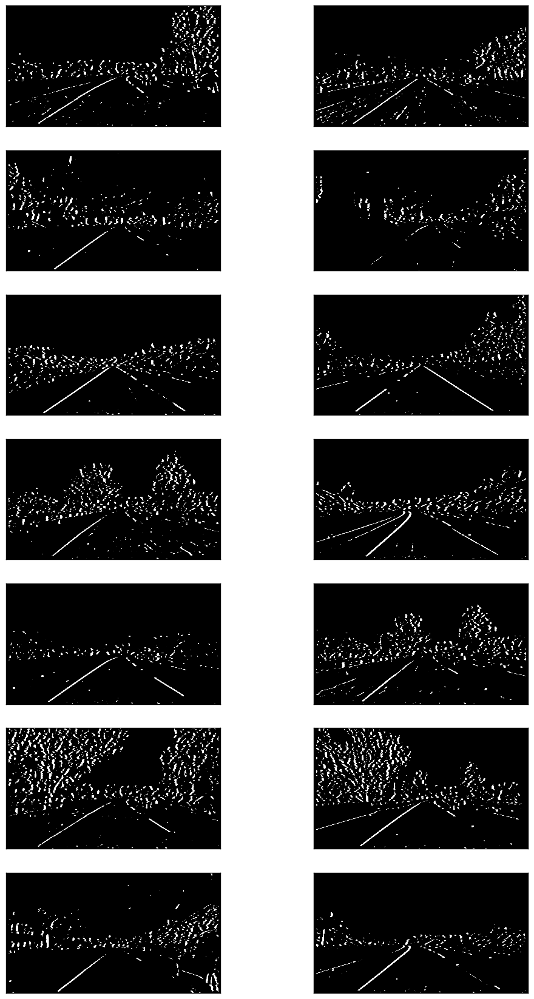

In [32]:
v_component = apply_image_arr(image_arr, rgb_thresh2, out = 'g')
plot_image_arr(v_component.reshape((n_images, 720, 1280)), cmap = 'gray')

In [33]:
def hsv_thresh(img, component = 'v', thresh_min = 220, thresh_max=255):
    hls = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2HSV)
    if component == 'v':
        s = hls[:,:,2]
    elif component == 'h':
        s = hls[:,:,0]
    binary = np.zeros_like(s)
    binary[(s > thresh_min) & (s <= thresh_max)] = 1
    return binary

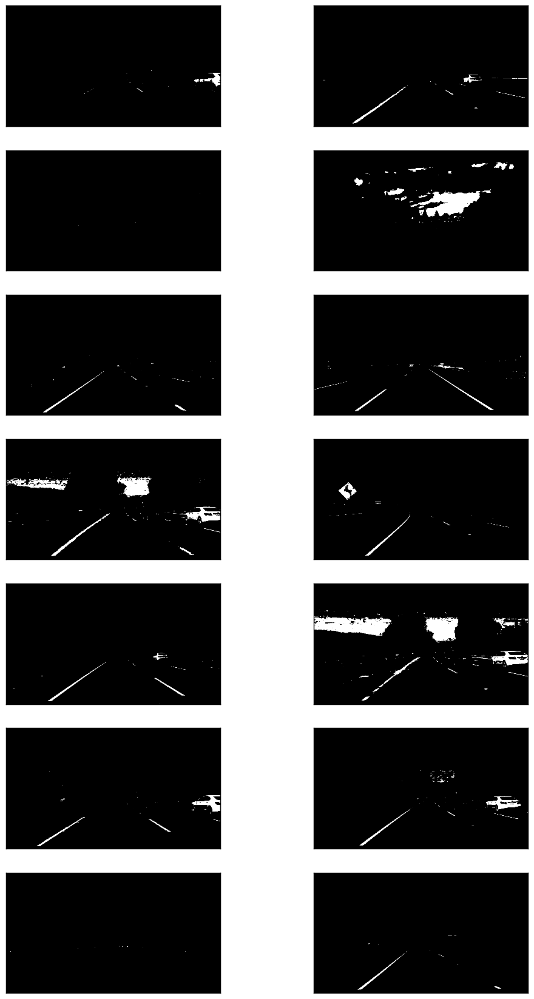

In [34]:
v_component = apply_image_arr(image_arr, hsv_thresh, out = 'g')
plot_image_arr(v_component.reshape((n_images, 720, 1280)), cmap = 'gray')

In [35]:
def markingDetectionB(image, thresh_min = 245, thresh_max = 255):
    LAB = cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_RGB2LAB)
    image = LAB[:,:,2]
    image = cv2.equalizeHist(image)
    binary = np.zeros_like(image)
    binary[(image >= thresh_min) & (image <= thresh_max)] = 1            
    return binary

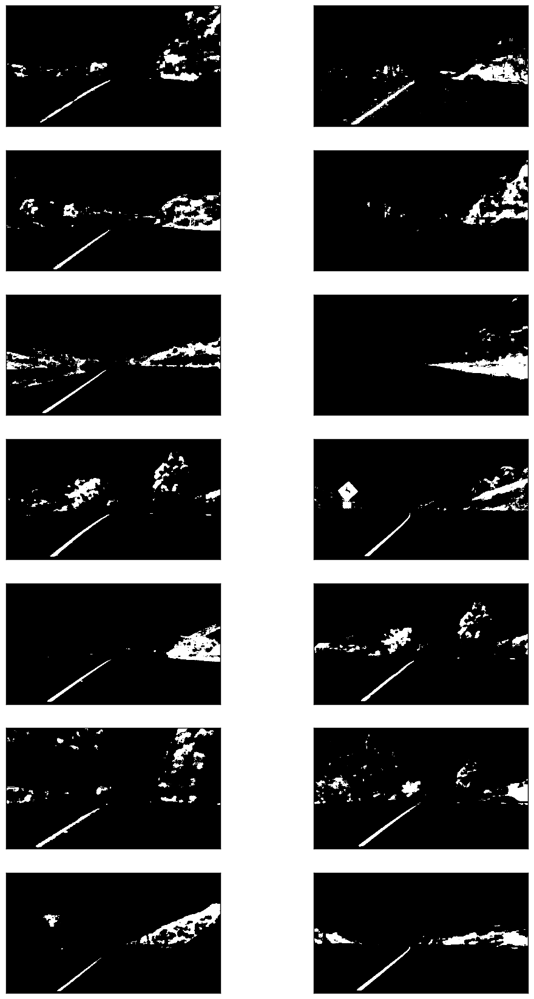

In [36]:
b_component = apply_image_arr(image_arr, markingDetectionB, out = 'g')
plot_image_arr(b_component.reshape((n_images, 720, 1280)), cmap = 'gray')

### Threshold combination


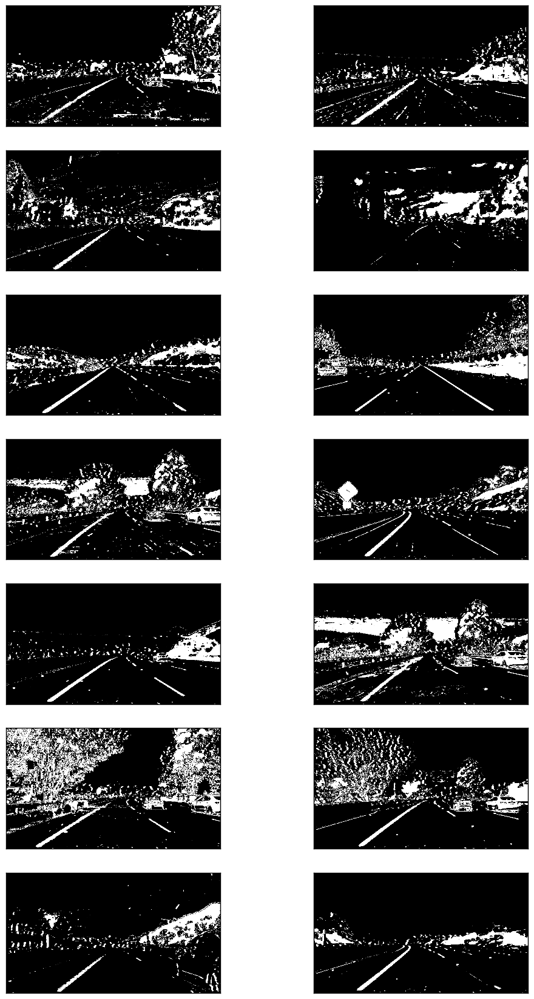

In [37]:
def combined_threshold(img): 
    # Sobel along x and y
    sx_binary = abs_sobel_thresh(img,  orient='x', thresh_min=10, thresh_max=255)
    sy_binary = abs_sobel_thresh(img, orient='y', thresh_min=25, thresh_max=255)
    
    # Sobel magnitude
    mag_binary = mag_sobel_thresh(img)
    
    # Sobel direction
    dir_binary = dir_sobel_thresh(img)
    
    # S-channel
    s_binary = hls_thresh(img)
    
    # R channel
    r_binary = rgb_thresh(img)
    
    # V channel
    v_binary = hsv_thresh(img)
    
    # B channel
    b_binary = markingDetectionB(img)
    
    # Bump filter
    a_binary = rgb_thresh2(img)
    
    # Combination
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | np.logical_and(sx_binary == 1, sy_binary ==1)  |(np.logical_and(dir_binary == 1, s_binary == 1))|
                    (r_binary == 1) | (b_binary == 1) | (v_binary == 1) | (a_binary == 1)] = 1 
    
    return combined_binary

combined = apply_image_arr(image_arr, combined_threshold, out = 'g')
plot_image_arr(combined.reshape((n_images, 720, 1280)), cmap = 'gray')    


## Lane detection

The black and white images derived using different thresholing methods are now used to find the position of the lane lines on the road. For this purpose, a polynomial should be fitted to each line. This allows to extract useful information on the road, such as its curvature or the lateral position of the vehicle on the road.

### Starting point of the lane lines

The starting points of the lane lines are found by computing a histogram of the white pixels per column of the bird's eye image. By considering only the lower half of this image, the effect of curving roads is limitted. As pixels along the line are white, the sum along the corresponding columns will be much higher, which results in peaks in the histogram. By taking the maximum on the left side and the right side of the histogram separately, a good approximation of the starting point of the lane lines is obtained.

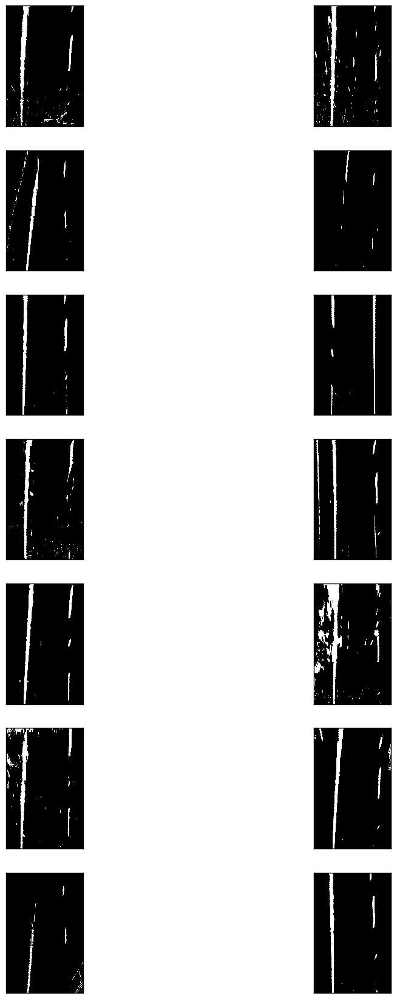

In [38]:
combined_bird = apply_image_arr(combined, bird_transform, out = 'g', out_shape=(2000, 1280))
plot_image_arr(combined_bird.reshape((n_images, 2000, 1280)), cmap = 'gray')    

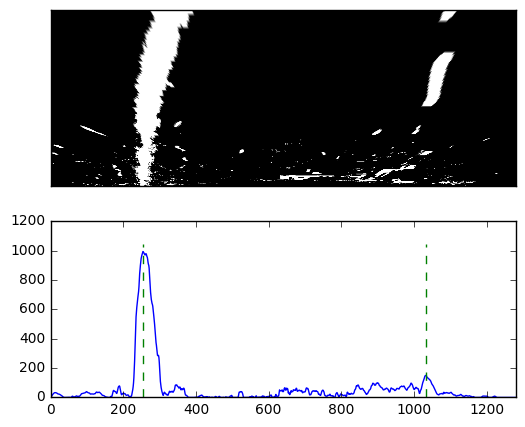

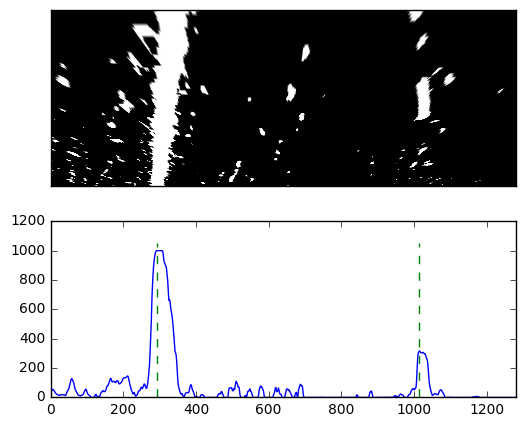

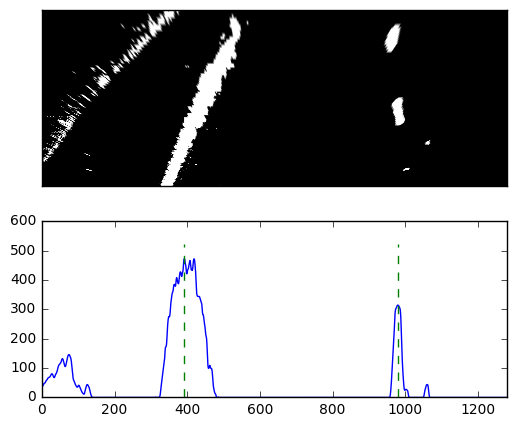

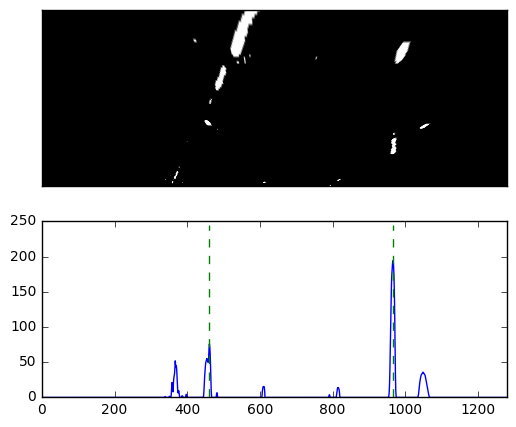

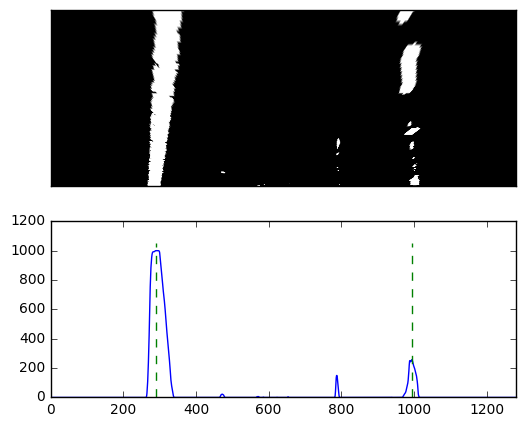

...

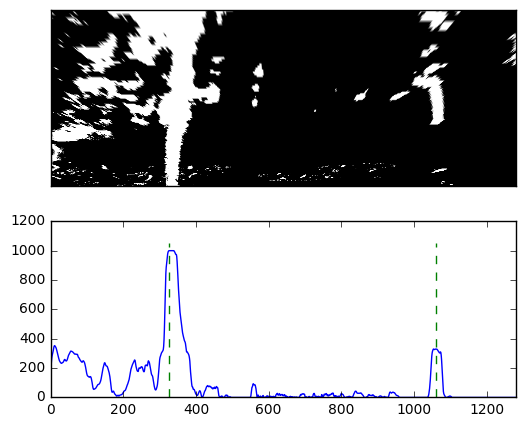

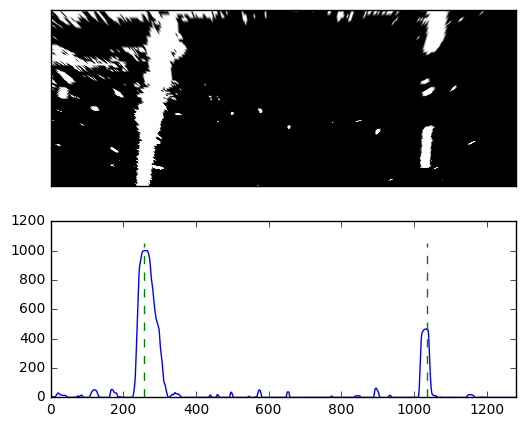

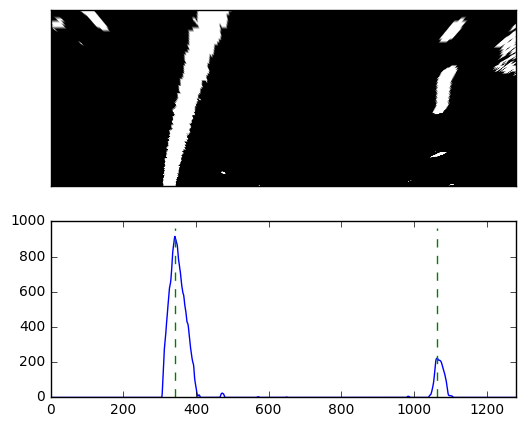

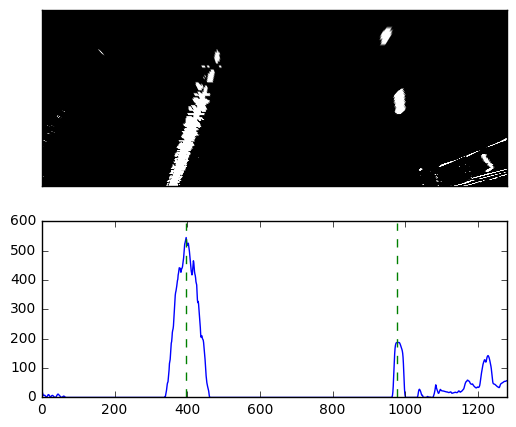

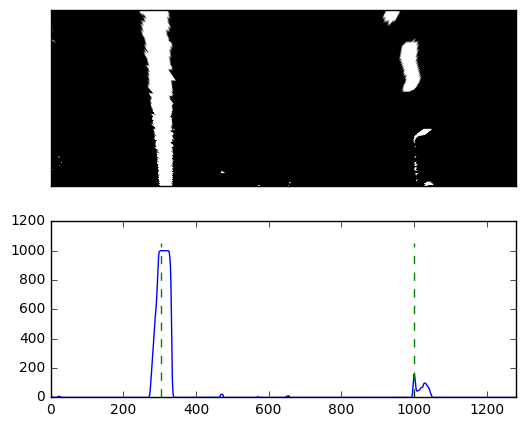

In [39]:
def histogram_start(img):
    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
    left_h = np.argmax(histogram[0:1280/2])
    right_h = np.argmax(histogram[1280/2:])+1280/2
    return left_h, right_h, histogram

def histogram_plot(img):
    left_h, right_h, histogram = histogram_start(img)
    f, axarr = plt.subplots(2,1, figsize = (6,5))
    axarr[0].imshow(img, cmap = 'gray', aspect = 'auto')
    axarr[0].set_yticks([])
    axarr[0].set_xticks([])
    axarr[1].plot(histogram)
    axarr[1].plot([left_h, left_h],[0, np.max(histogram)+50],'g--')
    axarr[1].plot([right_h, right_h],[0, np.max(histogram)+50],'g--')
    axarr[1].set_xlim((0, 1280))
    plt.show()
    
_ = apply_image_arr(combined_bird, histogram_plot, out = 'g')

### Lane line initialisation

In [40]:
def lane_histogram_detection(bin_img, n_windows = 7, margin = 75, minpix = 500):
    left_h, right_h, _ = histogram_start(bin_img)

    out_img = np.dstack((bin_img, bin_img, bin_img))*255
    
    # Window height
    window_height = np.int(bin_img.shape[0]/n_windows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current window positions
    leftx_current = left_h
    rightx_current = right_h

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Iterate over windows
    for window in range(n_windows):
        
        # Identify window boundaries 
        win_y_low = bin_img.shape[0] - (window+1)*window_height
        win_y_high = bin_img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0),2) 
        cv2.rectangle(out_img,(int(win_xright_low),int(win_y_low)),(int(win_xright_high),int(win_y_high)),(0,255,0),2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx  = nonzerox[left_lane_inds]
    lefty  = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = quadratic_ransac_fit(lefty, leftx, "test")
    left_fit = left_fit[::-1]
    right_fit = quadratic_ransac_fit(righty, rightx, "test")
    right_fit = right_fit[::-1]
    
    # Update out_img
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Plot lane lines
    ploty = np.linspace(0, bin_img.shape[0]-1, bin_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left  = np.vstack((left_fitx, ploty)).T
    right = np.vstack((right_fitx, ploty)).T 
    cv2.polylines(out_img, np.int_([left]),0,(0, 255,0),3)
    cv2.polylines(out_img, np.int_([right]),0,(0, 255,0),3)
    
    return left_fit, right_fit, out_img

In [44]:
def plot_lane_histogram(bin_img):
    left_fit, right_fit, out_img = lane_histogram_detection(bin_img)
    plt.imshow(out_img.astype(np.uint8))
    plt.xlim(0, 1280)
    plt.ylim(2000, 0)
    plt.show()

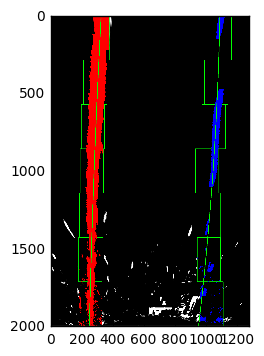

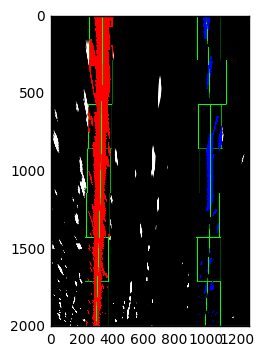

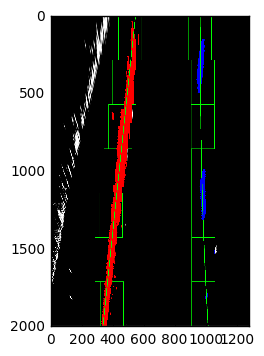

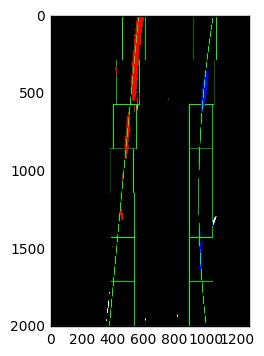

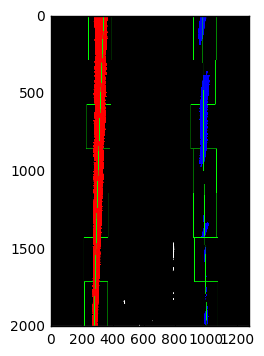

...

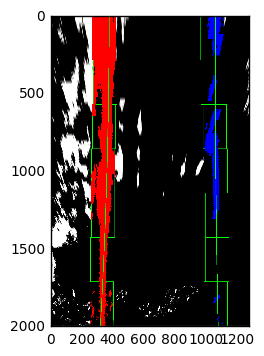

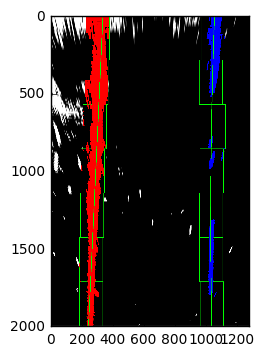

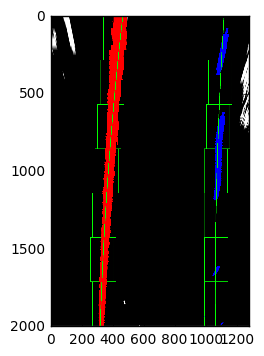

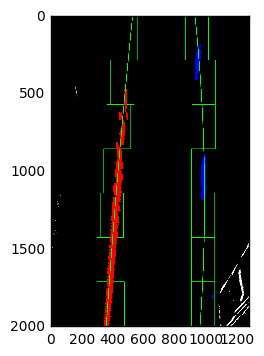

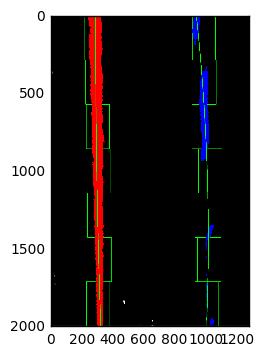

In [45]:
_ = apply_image_arr(combined_bird, plot_lane_histogram, out = 'g')

### Lane line update

In [46]:
def update_fit(bin_img, left_fit, right_fit, margin = 100):
    
    # Extract white pixels from the binary image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Detect indices of pixels around each of the provided fits
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Extract left and right line pixel positions
    leftx  = nonzerox[left_lane_inds]
    lefty  = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each lane
    left_fit = quadratic_ransac_fit(lefty, leftx, "test")
    left_fit = left_fit[::-1]
    right_fit = quadratic_ransac_fit(righty, rightx, "test")
    right_fit = right_fit[::-1]
    
    # Plot points
    ploty = np.linspace(0, bin_img.shape[0]-1, bin_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((bin_img, bin_img, bin_img))*255
    window_img = np.zeros_like(out_img)
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    pix = left_lane_inds.shape[0] + right_lane_inds.shape[0]
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))   
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Draw fitted polygons
    left  = np.vstack((left_fitx, ploty)).T
    right = np.vstack((right_fitx, ploty)).T 
    cv2.polylines(result, np.int_([left]),0,(0, 255,0),3)
    cv2.polylines(result, np.int_([right]),0,(0, 255,0),3)
    
    return left_fit, right_fit, result, pix

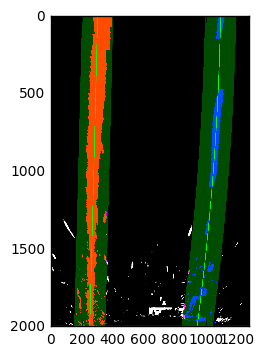

465182


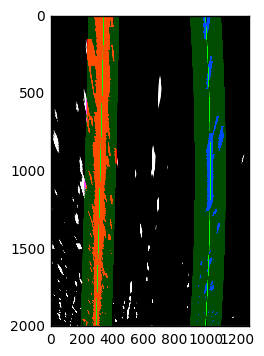

527460


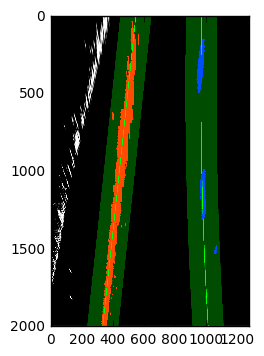

369598


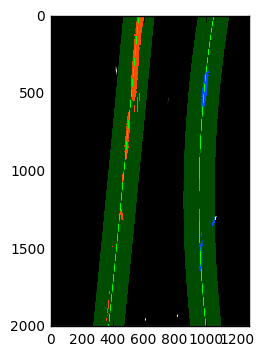

87918


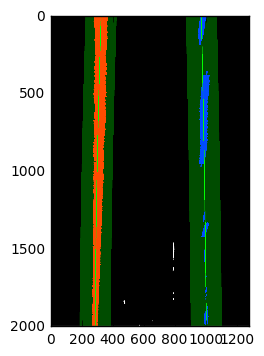

334722


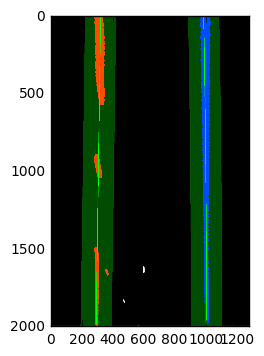

268344


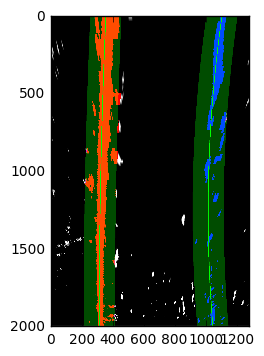

491930


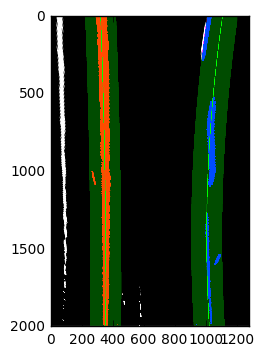

431880


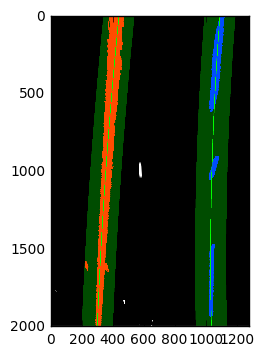

372056


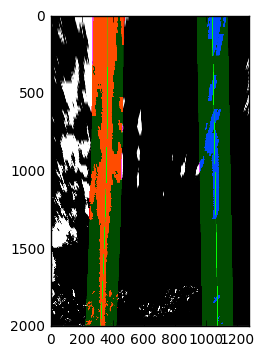

939332


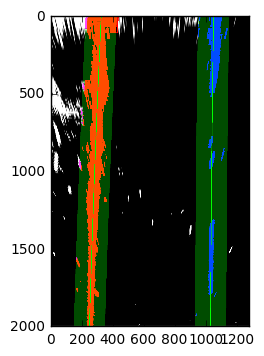

683036


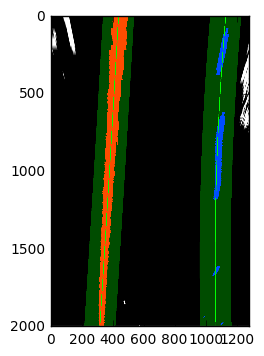

411524


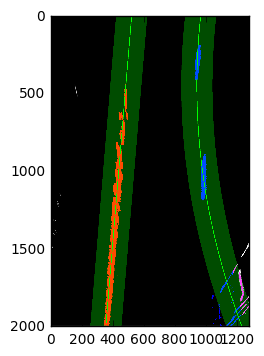

167458


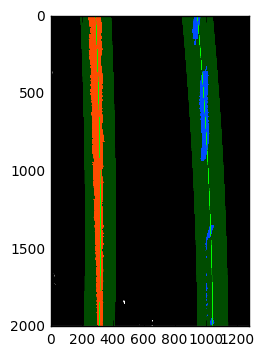

329360


In [47]:
def test_update(bin_img):
    left_fit, right_fit, _ = lane_histogram_detection(bin_img)
    left_fit, right_fit, result, pix    = update_fit(bin_img, left_fit, right_fit)
    plt.imshow(result.astype(np.uint8))
    plt.xlim(0, 1280)
    plt.ylim(2000, 0)
    plt.show()
    print(pix)
    
_ = apply_image_arr(combined_bird, test_update, out = 'g')

In [48]:
def road_plot(left_fit, right_fit, bin_img):
    
    base = np.zeros_like(bin_img)
    img  = np.dstack((base,base,base))
    
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left  = np.vstack((left_fitx, ploty)).T
    right = np.vstack((right_fitx, ploty)).T 
    poly  = np.vstack((left,right[::-1,:]))
    
    cv2.fillPoly(img, np.int_([poly]), (0,255, 0))
    img = bird_inverse(img)
    
    return img

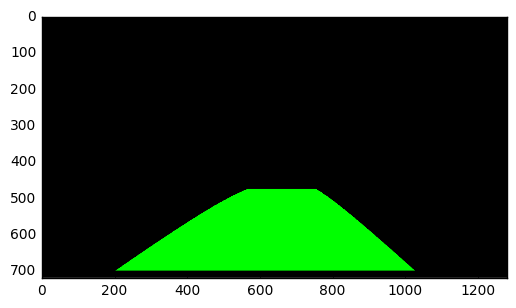

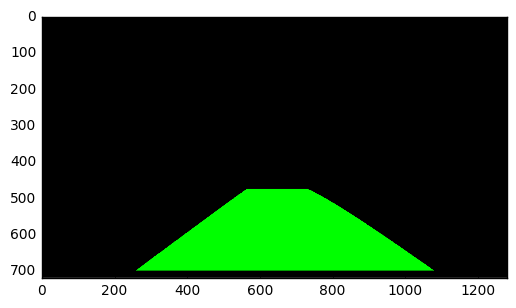

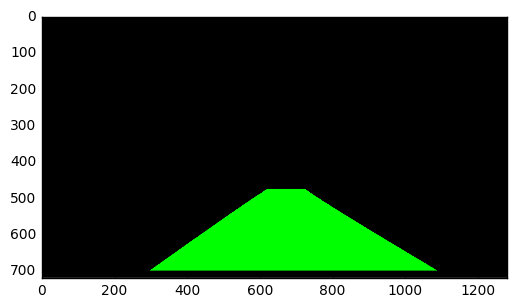

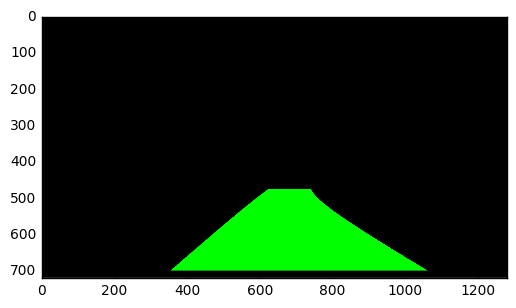

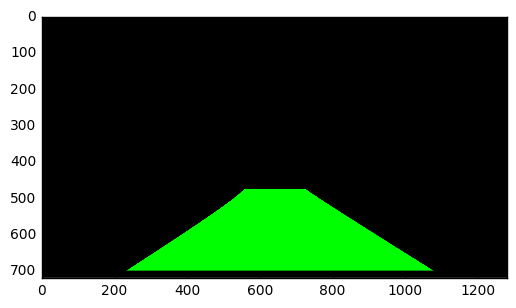

...

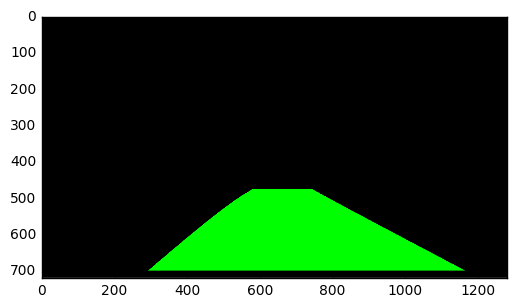

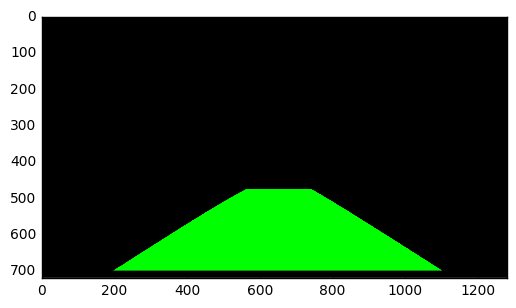

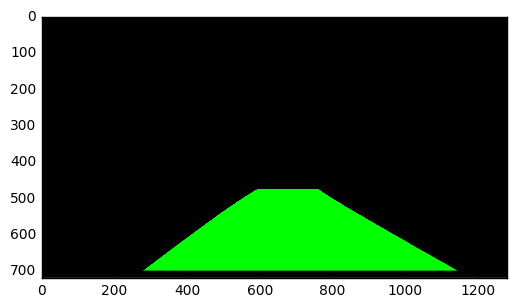

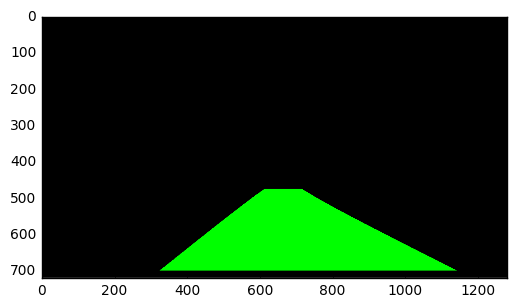

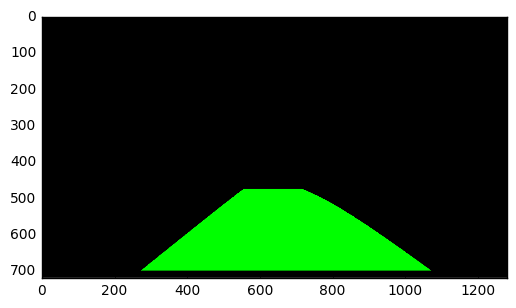

In [49]:
def test_road(bin_img):
    left_fit, right_fit, _ = lane_histogram_detection(bin_img)
    left_fit, right_fit, _, _ = update_fit(bin_img, left_fit, right_fit)
    road = road_plot(left_fit, right_fit, bin_img)
    plt.imshow(road.astype(np.uint8))
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()
    
_ = apply_image_arr(combined_bird, test_road, out = 'g')

### Extraction of useful information

In [75]:
def curvature(left_fit, right_fit, y_eval = 720):
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 8/2000 # meters per pixel in y dimension
    xm_per_pix = 3.7/2000 # meters per pixel in x dimension
    
    alm = left_fit[0]*xm_per_pix/ym_per_pix**2
    blm = left_fit[1]*xm_per_pix/ym_per_pix
    clm = left_fit[2]*xm_per_pix
    
    arm = right_fit[0]*xm_per_pix/ym_per_pix**2
    brm = right_fit[1]*xm_per_pix/ym_per_pix
    crm = right_fit[2]*xm_per_pix
    
    left_curve = ((1 + (2*alm*y_eval + blm)**2)**1.5) / np.absolute(2*alm)
    right_curve = ((1 + (2*arm*y_eval + brm)**2)**1.5) / np.absolute(2*arm)
    
    y_b = 2000
    left_b = left_fit[0]*y_b**2 + left_fit[1]*y_b + left_fit[2]    
    right_b = right_fit[0]*y_b**2 + right_fit[1]*y_b + right_fit[2]
    mid_lane = (left_b + right_b)/ 2
    veh_b = 1280/2
    offset = (mid_lane-veh_b)*xm_per_pix
    
    return left_curve, right_curve, offset

## Applicatio of the pipeline on the videos

In [76]:
def evalPoly(poly, y_b):
    return  poly[0]*y_b**2 + poly[1]*y_b + poly[2]   

def getCurv(poly, y_b):
    return ((1 + (2*poly[0]*y_b + poly[1])**2)**1.5) / np.absolute(2*poly[0])

In [77]:
def correct_fit(left_fit, right_fit, n_left_fit, n_right_fit):
    
    # Check paralellism on new fit
    delta_up = np.abs(evalPoly(n_left_fit, 0) - evalPoly(n_right_fit, 0))
    delta_do = np.abs(evalPoly(n_left_fit, 720) - evalPoly(n_right_fit, 720))
    parallel = np.abs(delta_up - delta_do) < 100
    
    # Check curvature on new fit
    left_curve  = getCurv(n_left_fit, 720)
    right_curve = getCurv(n_right_fit, 720)
    ok_curve    = np.abs(left_curve - right_curve)<100000
    
    return parallel

In [78]:
def pipeline(img, colorspace = "RGB"):
    global left_fit, right_fit
    img = img.astype(np.float32)
    if colorspace == "BGR":
        img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)
    img = undistort(img, mtx, dist)
    #img = cv2.blur(img, (2,2))
    threshold = combined_threshold(img)
    bird = bird_transform(threshold)
    # Update existing fitting
    if left_fit is not None and right_fit is not None:
        n_left_fit, n_right_fit, detection_result, pix    = update_fit(bird, left_fit, right_fit)
        # In case quality of the fit is not good
        if pix < 200000:
            n_left_fit, n_right_fit, detection_result = lane_histogram_detection(bird)
            
        if correct_fit(left_fit, right_fit, n_left_fit, n_right_fit):
            left_fit = left_fit*0.9 + n_left_fit*0.1
            right_fit = right_fit*0.9 + n_right_fit*0.1
            
    # Create new fit
    else:
        left_fit, right_fit, detection_result = lane_histogram_detection(bird)
        
    
    road = road_plot(left_fit, right_fit, bird)
    result = cv2.addWeighted(img.astype(np.uint8), 1, road.astype(np.uint8), 0.3, 0)
    x_offset = 1024
    y_offset = 0
    detection_result = cv2.resize(detection_result, (0,0), fx = 0.2, fy = 0.2)
    result[y_offset:y_offset+detection_result.shape[0], x_offset:x_offset+detection_result.shape[1]] = detection_result
    x_offset = 1024
    y_offset = 400
    threshold = cv2.resize(threshold, (0,0), fx = 0.2, fy = 0.2)
    result[y_offset:y_offset+threshold.shape[0], x_offset:x_offset+threshold.shape[1]] =255*np.dstack((threshold,threshold,threshold))
    left,right, offset = curvature(left_fit, right_fit)
    result = cv2.putText(result, 'Left radius  = ' + str(int(left)) + " [m]", (50,50), 2, 1, (255,0,0), 2)
    result = cv2.putText(result, 'Right radius = ' + str(int(right)) + " [m]", (50,100), 2, 1, (255,0,0), 2)
    result = cv2.putText(result, 'Offset = ' + str(offset) + " [m]", (50,150), 2, 1, (255,0,0), 2)
    if colorspace == "BGR":
        result = cv2.cvtColor(result.astype(np.uint8), cv2.COLOR_RGB2BGR)
    return result

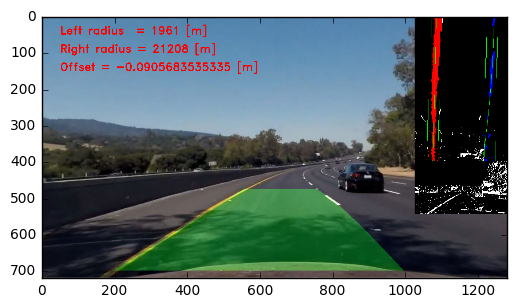

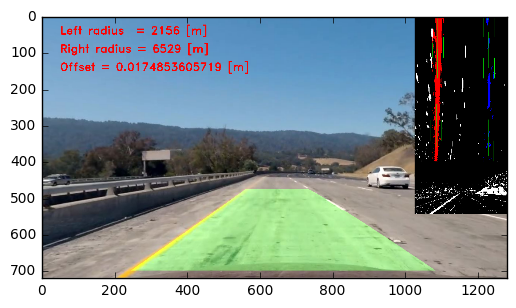

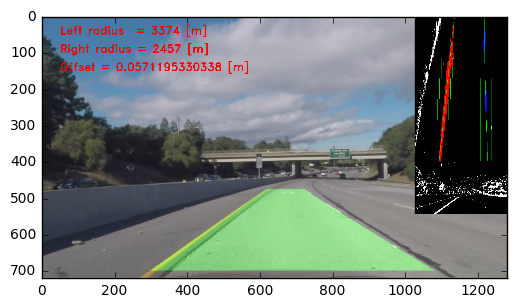

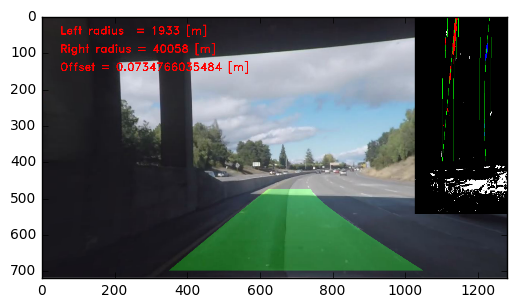

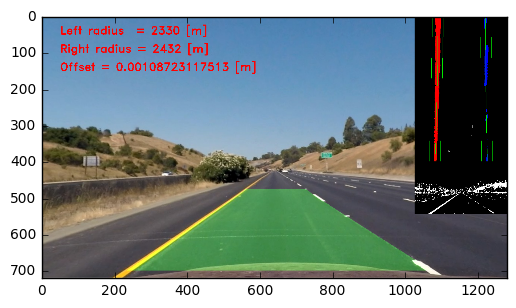

...

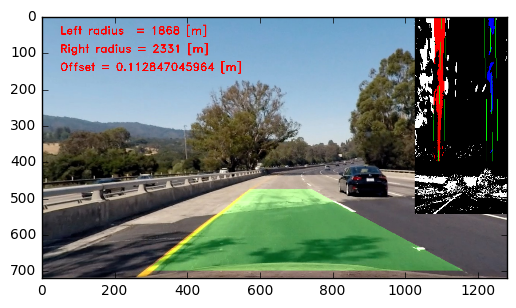

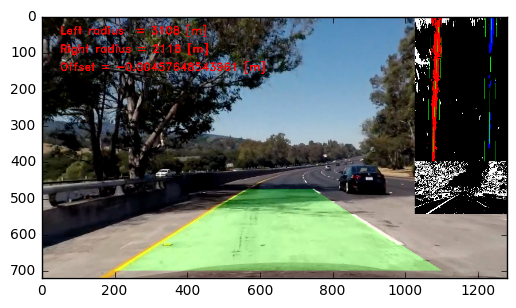

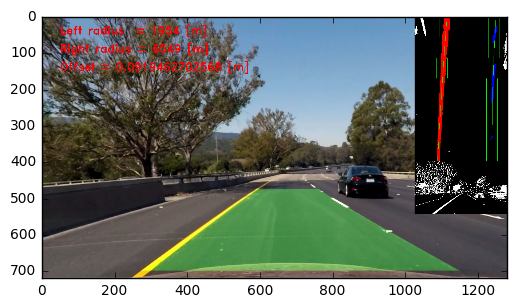

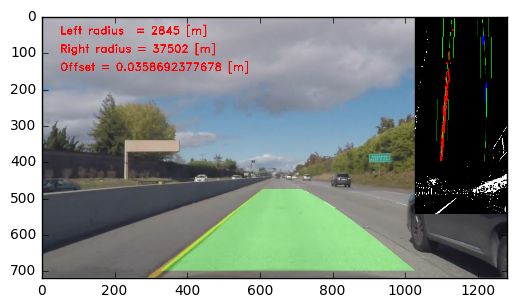

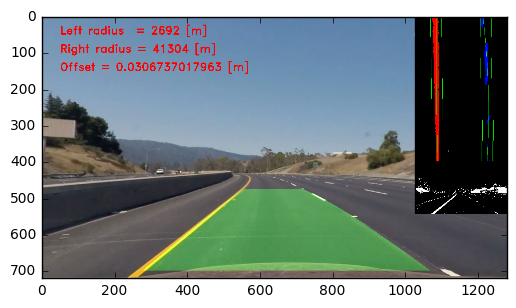

In [79]:
def test_pipeline(img):
    global left_fit, right_fit
    left_fit = None
    right_fit = None
    result = pipeline(img)
    plt.imshow(result.astype(np.uint8))
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()


_ = apply_image_arr(image_arr,test_pipeline, out = 'g')

In [80]:
output = 'white.mp4'
clip = VideoFileClip("project_video.mp4")
global left_fit, right_fit
left_fit = None
right_fit = None
clip = clip.fl_image(pipeline)
%time clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video white.mp4
[MoviePy] Writing video white.mp4


100%|█████████████████████████████████████▉| 1260/1261 [11:45<00:00,  1.75it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: white.mp4 

Wall time: 11min 45s


In [52]:

HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(output))

In [81]:
output = 'white2.mp4'
clip = VideoFileClip("challenge_video.mp4")
global left_fit, right_fit
left_fit = None
right_fit = None
clip = clip.fl_image(pipeline)
%time clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video white2.mp4
[MoviePy] Writing video white2.mp4


100%|████████████████████████████████████████| 485/485 [04:04<00:00,  2.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: white2.mp4 

Wall time: 4min 5s


In [79]:
output = 'white3.mp4'
clip = VideoFileClip("harder_challenge_video.mp4")
global left_fit, right_fit
left_fit = None
right_fit = None
clip = clip.fl_image(pipeline)
%time clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video white3.mp4
[MoviePy] Writing video white3.mp4


100%|█████████████████████████████████████▉| 1199/1200 [14:00<00:00,  1.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: white3.mp4 

Wall time: 14min 1s


In [ ]:
def markingDetection(image, tau = 30, thresh_min = 60, thresh_max = 255):

    #hls = cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_RGB2LAB)
    image = image[:,:,1]
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(30,30))
    image = clahe.apply(image.astype(np.uint8))
    plt.imshow(image, cmap = 'gray')
    plt.show()
    dst = np.zeros_like(image)
    height = image.shape[0]
    width  = image.shape[1]
    for i in range(height):
        line = image[i,:]
        for j in range(tau, width-tau):
            if line[j] is not 0:
                aux = 2*line[j] - line[j-tau] - line[j+tau]
                aux -= 0.5*np.abs(line[j-tau] - line[j+tau])
                aux = np.min((np.max((0, aux)), 255))
                dst[i,j] = aux  
    binary = np.zeros_like(dst)
    binary[(dst >= thresh_min) & (dst <= thresh_max)] = 1            
    return dst

In [ ]:
for i in range(n_images):
    out = markingDetection(image_arr[i,:,:,:])
    plt.imshow(out, cmap = 'gray')
    plt.show()

In [ ]:
for i in range(n_images):
    
    img = image_arr[i,:,:,:].astype(np.uint8)

    plt.imshow(img)
    plt.show()

    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_hls = cv2.medianBlur(img_hls, 5)
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    img_lab = cv2.medianBlur(img_lab, 5)
    
    big_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (31, 31))
    small_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))

    greenery = (img_lab[:, :, 2].astype(np.uint8) > 130) & cv2.inRange(img_hls, (0, 0, 50), (35, 190, 255))
    road_mask = np.logical_not(greenery).astype(np.uint8) & (img_hls[:, :, 1] < 250)
    road_mask = cv2.morphologyEx(road_mask, cv2.MORPH_OPEN, small_kernel)
    road_mask = cv2.dilate(road_mask, big_kernel)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 3))
    black = cv2.morphologyEx(img_lab[:,:, 0], cv2.MORPH_TOPHAT, kernel)
    lanes = cv2.morphologyEx(img_hls[:,:,1], cv2.MORPH_TOPHAT, kernel)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 13))
    lanes_yellow = cv2.morphologyEx(img_lab[:, :, 2], cv2.MORPH_TOPHAT, kernel)

    mask = np.zeros_like(img)
    mask[:, :, 0] = cv2.adaptiveThreshold(black, 1, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 13, -6)
    mask[:, :, 1] = cv2.adaptiveThreshold(lanes, 1, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 13, -4)
    mask[:, :, 2] = cv2.adaptiveThreshold(lanes_yellow, 1, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,
                                                       13, -1.5)
    mask *= np.dstack((road_mask,road_mask,road_mask))
    small_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    total_mask = np.any(mask, axis=2).astype(np.uint8)
    total_mask = cv2.morphologyEx(total_mask.astype(np.uint8), cv2.MORPH_ERODE, small_kernel)

    

In [ ]:
interact(print, n = (0,1))

In [ ]:
help(cv2.blur)

In [ ]:
x = np.array([[1,1],[2,3]])
print(x)
print(np.power(x,2))

In [43]:
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures

def quadratic_ransac_fit(x, y, name):
    x_ = x.reshape((-1, 1))
    y_ = y.reshape((-1, 1))

    xi = np.linspace(min(x), max(x), 100).reshape((-1, 1))

    poly_2 = PolynomialFeatures(degree=2)
    x_2 = poly_2.fit_transform(x_)
    xi_2 = poly_2.fit_transform(xi)

    m = linear_model.RANSACRegressor(linear_model.LinearRegression())
    m.fit(x_2, y_)
    yi = m.predict(xi_2)
    c = m.estimator_.coef_
    yi_b = np.dot(c, xi_2.T).T

    # the coefficients dont include the x^0 term for some reason??
    c_b = np.array([float(yi[3][0] - yi_b[0]), c[0, 1], c[0, 2]])
    yi_b = np.dot(c_b, xi_2.T).T

    return c_b